In [1]:
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt

In [14]:
covid = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/07-14-2020.csv')
covid.rename(columns={'Last_Update':'Date','Province_State':'State','Country_Region':'Country'},inplace=True)
covid=covid[["Date","State","Country","Confirmed","Deaths","Recovered"]]
grouped = covid.groupby(['Country','Date'])
covid_confirmed = grouped.sum().reset_index().sort_values(['Date'],ascending=False)
covid_confirmed

,Country,Date,Confirmed,Deaths,Recovered
0,Afghanistan,2020-07-15 04:34:39,34740,1048,21454
130,Oman,2020-07-15 04:34:39,59568,273,37987
121,Namibia,2020-07-15 04:34:39,864,2,29
122,Nepal,2020-07-15 04:34:39,17061,38,10328
123,Netherlands,2020-07-15 04:34:39,51362,6154,193
...,...,...,...,...,...
68,Ghana,2020-07-15 04:34:39,24988,139,21067
190,Zimbabwe,2020-07-15 04:34:39,1064,20,343
32,Canada,2020-07-13 12:34:33,13,0,13
176,US,2020-07-10 02:34:22,1,0,0


In [ ]:
#df = (covid_confirmed[covid_confirmed['Date'].in("2020/07/15")].sort_values(by="Confirmed",ascending=False).head(10))
#df

In [ ]:
covid = pd.read_csv('world_data/covid_19_data.csv')
covid.tail()

In [3]:
covid.rename(columns={'Last_Update':'Date','Province_State':'State','Country_Region':'Country'},inplace=True)

In [4]:
covid=covid[["Date","State","Country","Confirmed","Deaths","Recovered"]]

In [5]:
grouped = covid.groupby(['Country','Date'])
covid_confirmed = grouped.sum().reset_index().sort_values(['Date'],ascending=False)
covid_confirmed.head()

,Country,Date,Confirmed,Deaths,Recovered
22971,Timor-Leste,07/14/2020,24.0,0.0,24.0
16811,Niger,07/14/2020,1099.0,68.0,992.0
17936,Paraguay,07/14/2020,3074.0,25.0,1308.0
2690,Bhutan,07/14/2020,84.0,0.0,78.0
10280,Iceland,07/14/2020,1905.0,10.0,1882.0


In [6]:
df = (covid_confirmed[covid_confirmed['Date'].eq("07/14/2020")].sort_values(by="Confirmed",ascending=False).head(10))

In [7]:
df

,Country,Date,Confirmed,Deaths,Recovered
23825,US,07/14/2020,3431574.0,136466.0,1049098.0
3196,Brazil,07/14/2020,1926824.0,74133.0,1323425.0
10447,India,07/14/2020,936181.0,24309.0,592032.0
18970,Russia,07/14/2020,738787.0,11597.0,511958.0
18067,Peru,07/14/2020,333867.0,12229.0,223261.0
4764,Chile,07/14/2020,319493.0,7069.0,289220.0
15241,Mexico,07/14/2020,311486.0,36327.0,245830.0
21017,South Africa,07/14/2020,298292.0,4346.0,146279.0
23650,UK,07/14/2020,292931.0,45053.0,1385.0
10729,Iran,07/14/2020,262173.0,13211.0,225270.0


Text(0, 0.5, 'Country')

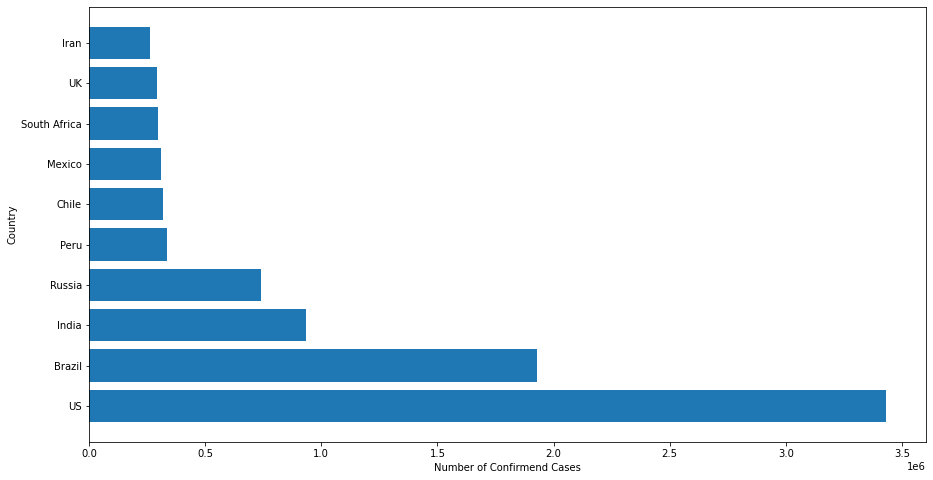

In [8]:
#plotting the initial horaizontal barchart 
fig, ax = plt.subplots(figsize=(15, 8))
ax.barh(df['Country'], df['Confirmed'])
plt.xlabel('Number of Confirmend Cases')
plt.ylabel('Country')

Text(0, 0.5, 'Country')

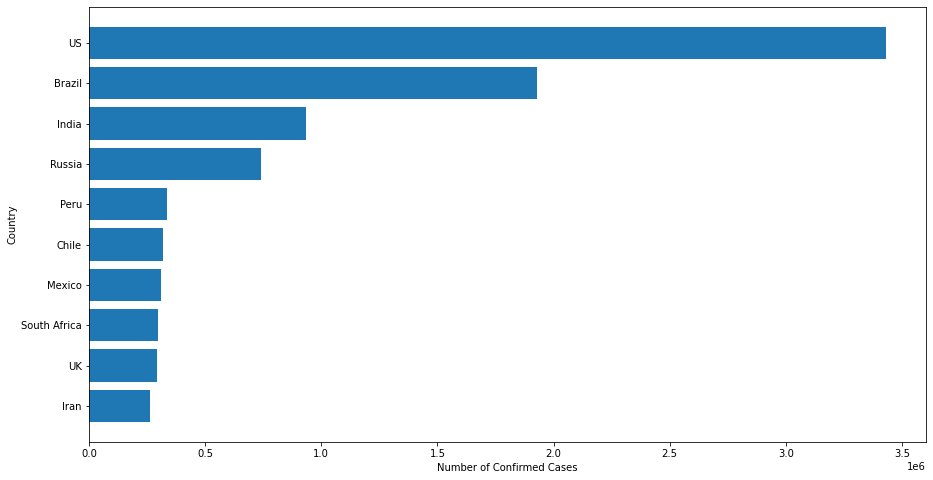

In [9]:
dff=df[::-1]
fig, ax = plt.subplots(figsize=(15, 8))
ax.barh(dff['Country'], dff['Confirmed'])
plt.xlabel('Number of Confirmed Cases')
plt.ylabel('Country')

In [19]:
from random import randint
import random
c_code = []
random.seed(1000)
for i in range(len(covid_confirmed.Country.unique())):
    c_code.append('#%06X' % randint(0, 0xFFFFFF))
    
colors = dict(zip(covid_confirmed.Country.unique(),c_code))

In [20]:
color=["#980505","#CD1212","#D84E4E","#CB6262","#D39B5F","#F7EC10","#D0F710","#9CF710","#B4D67F","#969C8E"]

Text(1, 0.4, '15/07/2020')

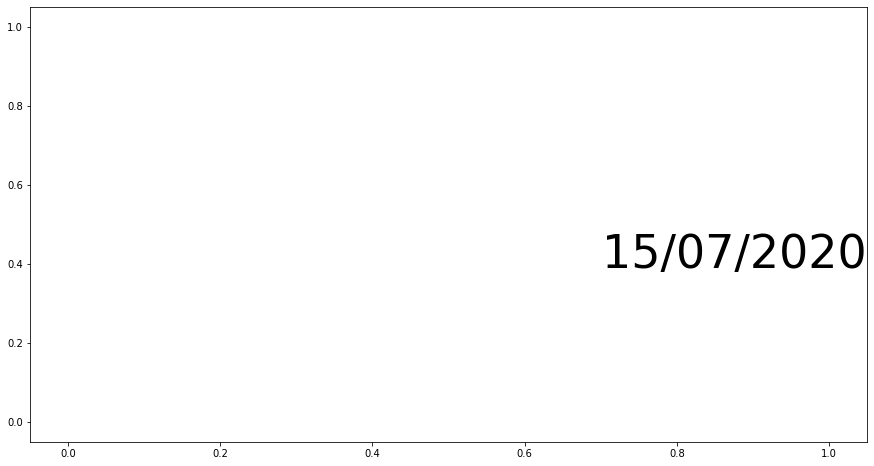

In [23]:
fig, ax = plt.subplots(figsize=(15, 8))
# pass colors values to `color=`
ax.barh(df['Country'], df['Confirmed'], color=[colors[x] for x in df['Country']])
# iterate over the values to plot labels and values (Tokyo, Asia, 38194.2)
for i, (value, name) in enumerate(zip(df['Confirmed'], df['Country'])):
    ax.text(value, i,     name,            ha='right')  # Tokyo: name
    ax.text(value, i-0.25,     value,           ha='right')   # 38194.2: value
# Add year right middle portion of canvas
ax.text(1, 0.4, "15/07/2020", transform=ax.transAxes, size=46, ha='right')

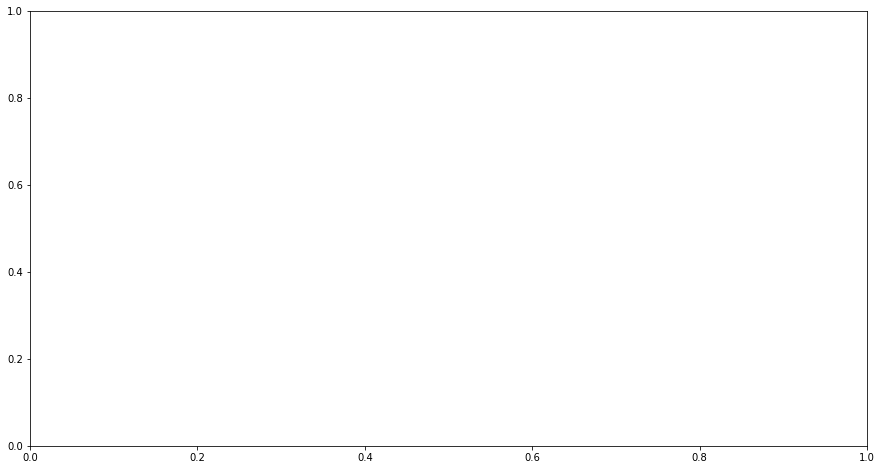

In [24]:
fig, ax = plt.subplots(figsize=(15, 8))
def draw_barchart(date,case="Deaths"):
    dff= (covid_confirmed[covid_confirmed['Date'].eq(date)].sort_values(by=case,ascending=False).head(10))[::-1]
    ax.clear()
    ax.barh(dff['Country'], dff['Deaths'], color=["#980505","#CD1212","#D84E4E","#CB6262","#D39B5F","#F7EC10","#D0F710","#9CF710","#B4D67F","#969C8E"][::-1])
    dx = dff['Deaths'].max() / 200
    for i, (value, name) in enumerate(zip(dff['Deaths'], dff['Country'])):
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value-dx, i-.25, value, size=10, color='#17202A', ha='right', va='baseline')
        #ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, date, transform=ax.transAxes, color='#777777', size=30, ha='right', weight=800)
    ax.text(0, 1.06, 'Number of Cases', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, 'The number of '+str(case)+' Cases upto 15 JULY 2020',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    plt.box(False)

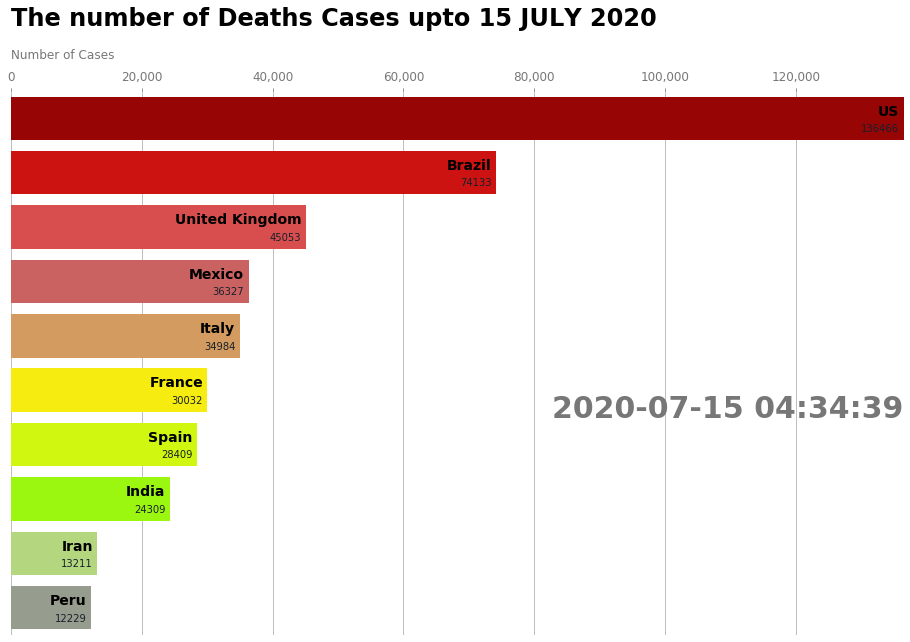

In [25]:
from matplotlib import animation as F
from IPython.display import HTML
fig1,ax = plt.subplots(figsize=(16,10)) #Set figure for plot
animator = F.FuncAnimation(fig1,draw_barchart,frames=covid.Date.unique(),interval=300) #Building animation
HTML(animator.to_jshtml())

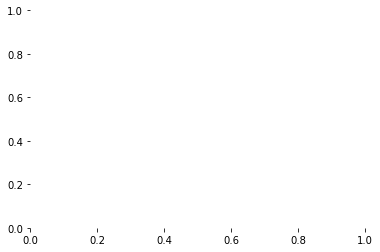

In [19]:
writergif = F.PillowWriter(fps=5)
animator.save("D:/Projects/Sentiment/final_proj/website/data/anim.gif", writer=writergif)

In [20]:
modified_confirmed = covid_confirmed[covid_confirmed.Confirmed > 0]

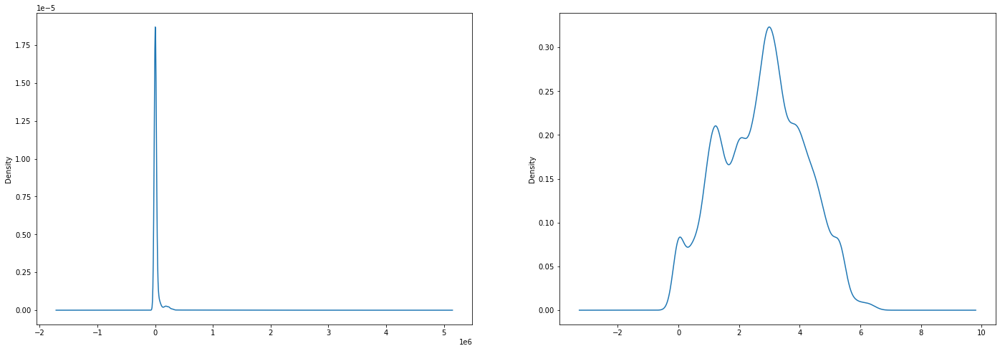

In [21]:
plt.subplots(figsize=(24,8))
plt.subplot(1,2,1)
(modified_confirmed.Confirmed).plot.kde()
plt.subplot(1,2,2)
(np.log10(modified_confirmed.Confirmed)).plot.kde()

In [22]:
modified_confirmed['Affected_Factor'] = np.log10(modified_confirmed.Confirmed)

C:\Users\Abhishek Prasad\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [23]:
import plotly as py
import plotly.express as px

In [24]:
fig = px.choropleth(
    modified_confirmed[::-1], #Dataframe
    locations= 'Country', #Spatial coordinates, can give Lat and Lon in separate params
    locationmode= 'country names', #Type of spatial coordinates
    color= 'Affected_Factor', #Values to be color coded
    hover_name= 'Country', #Text to be displayed in Bold upon hover
    hover_data= ['Confirmed','Recovered','Deaths'], #Extra text to be displayed in Hover tip
    animation_frame= 'Date', #Data for animation, time-series data
    color_continuous_scale=px.colors.diverging.RdYlGn[::-1]
)

fig.update_layout(
    title_text =   " COVID-19 Spread in the World up to 15 July 2020",
    title_x = 0.5,
    geo= dict(
        showframe= False,
        showcoastlines= False,
        projection_type = 'equirectangular'
    )
)

In [25]:
fig.write_html("D:/Projects/Sentiment/final_proj/website/data/map.html")